# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
import sys

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.model_selection import GridSearchCV
from wordcloud import WordCloud
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

In [2]:
# using SQLite Table to read data.
con = sqlite3.connect(os.path.join( os.getcwd(), '..', 'database.sqlite' )) 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (5000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B005ZBZLT4,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ESG,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B005ZBZLT4,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ESG,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBEV0,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B001ATMQK2,"undertheshrine ""undertheshrine""",1296691200,5,I bought this 6 pack because for the price tha...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(4986, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

99.72

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(4986, 10)


1    4178
0     808
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [14]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

Why is this $[...] when the same product is available for $[...] here?<br />http://www.amazon.com/VICTOR-FLY-MAGNET-BAIT-REFILL/dp/B00004RBDY<br /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no 

In [15]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [16]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

Why is this $[...] when the same product is available for $[...] here? />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no idea what they were ordering; the other wants crispy cookies.  Hey, I'm sorry; b

In [17]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Wow.  So far, two two-star reviews.  One obviously had no idea what they were ordering; the other wants crispy cookies.  Hey, I am sorry; but these reviews do nobody any good beyond reminding us to look  before ordering.<br /><br />These are chocolate-oatmeal cookies.  If you do not like that combination, do not order this type of cookie.  I find the combo quite nice, really.  The oatmeal sort of "calms" the rich chocolate flavor and gives the cookie sort of a coconut-type consistency.  Now let is also remember that tastes differ; so, I have given my opinion.<br /><br />Then, these are soft, chewy cookies -- as advertised.  They are not "crispy" cookies, or the blurb would say "crispy," rather than "chewy."  I happen to like raw cookie dough; however, I do not see where these taste like raw cookie dough.  Both are soft, however, so is this the confusion?  And, yes, they stick together.  Soft cookies tend to do that.  They are not individually wrapped, which would add to the cost.  Oh y

In [19]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor  and  traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [20]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Wow So far two two star reviews One obviously had no idea what they were ordering the other wants crispy cookies Hey I am sorry but these reviews do nobody any good beyond reminding us to look before ordering br br These are chocolate oatmeal cookies If you do not like that combination do not order this type of cookie I find the combo quite nice really The oatmeal sort of calms the rich chocolate flavor and gives the cookie sort of a coconut type consistency Now let is also remember that tastes differ so I have given my opinion br br Then these are soft chewy cookies as advertised They are not crispy cookies or the blurb would say crispy rather than chewy I happen to like raw cookie dough however I do not see where these taste like raw cookie dough Both are soft however so is this the confusion And yes they stick together Soft cookies tend to do that They are not individually wrapped which would add to the cost Oh yeah chocolate chip cookies tend to be somewhat sweet br br So if you wa

In [21]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

<h2><font color='red'>[3.2] Preprocessing Review Text and Summary</font></h2>

In [22]:
preprocessed_reviews = []
preprocessed_summary = []
# Sampling the data and preprocessing
def data_sampling_preprocessing(final, no_of_samples):
    
    final = final.sample(n=no_of_samples, replace=True)

    # Combining all the above stundents 
    from tqdm import tqdm
    preprocessed_reviews = []
    # tqdm is for printing the status bar
    for sentance in tqdm(final['Text'].values):
        sentance = re.sub(r"http\S+", "", sentance)
        sentance = BeautifulSoup(sentance, 'lxml').get_text()
        sentance = decontracted(sentance)
        sentance = re.sub("\S*\d\S*", "", sentance).strip()
        sentance = re.sub('[^A-Za-z]+', ' ', sentance)
        # https://gist.github.com/sebleier/554280
        sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
        preprocessed_reviews.append(sentance.strip())
        
    # Combining all the above stundents 
    from tqdm import tqdm
    preprocessed_summary = []
    # tqdm is for printing the status bar
    for summary in tqdm(final['Summary'].values):
        summary = re.sub(r"http\S+", "", summary)
        summary = BeautifulSoup(summary, 'lxml').get_text()
        summary = decontracted(summary)
        summary = re.sub("\S*\d\S*", "", summary).strip()
        summary = re.sub('[^A-Za-z]+', ' ', summary)
        # https://gist.github.com/sebleier/554280
        summary = ' '.join(e.lower() for e in summary.split() if e.lower() not in stopwords)

        preprocessed_summary.append(summary.strip())
        
    
    final['CleanedText'] = preprocessed_reviews #adding a column of CleanedText which displays the data after pre-processing of the review 
    final['CleanedText'] = final['CleanedText'].astype('str')

    final['CleanedSummary'] = preprocessed_summary #adding a column of CleanedSummary which displays the data after pre-processing of the Summary 
    final['CleanedSummary'] = final['CleanedSummary'].astype('str')

    final['Text_Summary'] = final['CleanedSummary'] + final['CleanedText']
    
    # # store final table into an SQlLite table for future.
    # conn = sqlite3.connect('final.sqlite')
    # c=conn.cursor()
    # conn.text_factory = str
    # final.to_sql('Reviews', conn,  schema=None, if_exists='replace', \
    #              index=True, index_label=None, chunksize=None, dtype=None)
    # conn.close()
    
    return final['Text_Summary']

# [4] Featurization

## [4.1] BAG OF WORDS

In [23]:
# #BoW
# count_vect = CountVectorizer() #in scikit-learn
# count_vect.fit(preprocessed_reviews)
# print("some feature names ", count_vect.get_feature_names()[:10])
# print('='*50)

# final_counts = count_vect.transform(preprocessed_reviews)
# print("the type of count vectorizer ",type(final_counts))
# print("the shape of out text BOW vectorizer ",final_counts.get_shape())
# print("the number of unique words ", final_counts.get_shape()[1])

## [4.2] Bi-Grams and n-Grams.

In [24]:
# #bi-gram, tri-gram and n-gram

# #removing stop words like "not" should be avoided before building n-grams
# # count_vect = CountVectorizer(ngram_range=(1,2))
# # please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# # you can choose these numebrs min_df=10, max_features=5000, of your choice
# count_vect = CountVectorizer(ngram_range=(1,2), min_df=10, max_features=5000)
# final_bigram_counts = count_vect.fit_transform(preprocessed_reviews)
# print("the type of count vectorizer ",type(final_bigram_counts))
# print("the shape of out text BOW vectorizer ",final_bigram_counts.get_shape())
# print("the number of unique words including both unigrams and bigrams ", final_bigram_counts.get_shape()[1])

## [4.3] TF-IDF

In [25]:
# tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10)
# tf_idf_vect.fit(preprocessed_reviews)
# print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
# print('='*50)

# final_tf_idf = tf_idf_vect.transform(preprocessed_reviews)
# print("the type of count vectorizer ",type(final_tf_idf))
# print("the shape of out text TFIDF vectorizer ",final_tf_idf.get_shape())
# print("the number of unique words including both unigrams and bigrams ", final_tf_idf.get_shape()[1])

## [4.4] Word2Vec

In [26]:
# # Train your own Word2Vec model using your own text corpus
# i=0
# list_of_sentance=[]
# for sentance in preprocessed_reviews:
#     list_of_sentance.append(sentance.split())

In [27]:
# # Using Google News Word2Vectors

# # in this project we are using a pretrained model by google
# # its 3.3G file, once you load this into your memory 
# # it occupies ~9Gb, so please do this step only if you have >12G of ram
# # we will provide a pickle file wich contains a dict , 
# # and it contains all our courpus words as keys and  model[word] as values
# # To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# # from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# # it's 1.9GB in size.


# # http://kavita-ganesan.com/gensim-word2vec-tutorial-starter-code/#.W17SRFAzZPY
# # you can comment this whole cell
# # or change these varible according to your need

# is_your_ram_gt_16g=False
# want_to_use_google_w2v = False
# want_to_train_w2v = True

# if want_to_train_w2v:
#     # min_count = 5 considers only words that occured atleast 5 times
#     w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
#     print(w2v_model.wv.most_similar('great'))
#     print('='*50)
#     print(w2v_model.wv.most_similar('worst'))
    
# elif want_to_use_google_w2v and is_your_ram_gt_16g:
#     if os.path.isfile('GoogleNews-vectors-negative300.bin'):
#         w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
#         print(w2v_model.wv.most_similar('great'))
#         print(w2v_model.wv.most_similar('worst'))
#     else:
#         print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

In [28]:
# w2v_words = list(w2v_model.wv.vocab)
# print("number of words that occured minimum 5 times ",len(w2v_words))
# print("sample words ", w2v_words[0:50])

## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [29]:
# # average Word2Vec
# # compute average word2vec for each review.
# sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
# for sent in tqdm(list_of_sentance): # for each review/sentence
#     sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
#     cnt_words =0; # num of words with a valid vector in the sentence/review
#     for word in sent: # for each word in a review/sentence
#         if word in w2v_words:
#             vec = w2v_model.wv[word]
#             sent_vec += vec
#             cnt_words += 1
#     if cnt_words != 0:
#         sent_vec /= cnt_words
#     sent_vectors.append(sent_vec)
# print(len(sent_vectors))
# print(len(sent_vectors[0]))

#### [4.4.1.2] TFIDF weighted W2v

In [30]:
# # S = ["abc def pqr", "def def def abc", "pqr pqr def"]
# model = TfidfVectorizer()
# tf_idf_matrix = model.fit_transform(preprocessed_reviews)
# # we are converting a dictionary with word as a key, and the idf as a value
# dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [31]:
# # TF-IDF weighted Word2Vec
# tfidf_feat = model.get_feature_names() # tfidf words/col-names
# # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

# tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
# row=0;
# for sent in tqdm(list_of_sentance): # for each review/sentence 
#     sent_vec = np.zeros(50) # as word vectors are of zero length
#     weight_sum =0; # num of words with a valid vector in the sentence/review
#     for word in sent: # for each word in a review/sentence
#         if word in w2v_words and word in tfidf_feat:
#             vec = w2v_model.wv[word]
# #             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
#             # to reduce the computation we are 
#             # dictionary[word] = idf value of word in whole courpus
#             # sent.count(word) = tf valeus of word in this review
#             tf_idf = dictionary[word]*(sent.count(word)/len(sent))
#             sent_vec += (vec * tf_idf)
#             weight_sum += tf_idf
#     if weight_sum != 0:
#         sent_vec /= weight_sum
#     tfidf_sent_vectors.append(sent_vec)
#     row += 1

# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

## [5.1] K-Means Clustering

In [32]:
# Source: https://docs.python.org/3/library/pickle.html

# Saving data to pickle file
def topicklefile(obj, file_name):
    pickle.dump(obj,open(file_name+'.pkl', 'wb'))

In [33]:
# Data from pickle file
def frompicklefile(file_name):
    data = pickle.load(open(file_name+'.pkl', 'rb'))
    return data

In [34]:
# Sort 'Time' column
final = final.sort_values(by='Time', ascending=True)

In [35]:
def apply_avgw2v_train_test(X_train):
    
    # Training own Word2Vec model using your own text corpus
    list_of_sent_train = []
    for sent in X_train:#final['Text_Summary'].values:
        list_of_sent_train.append(sent.split())
#     list_of_sent_test = []
#     for sent in X_test:#final['Text_Summary'].values:
#         list_of_sent_test.append(sent.split())

    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(list_of_sent_train,min_count=5,size=50, workers=8)

    w2v_words = list(w2v_model.wv.vocab)
#     print("number of words that occured minimum 5 times ",len(w2v_words))
#     print("sample words ", w2v_words[0:50])

    # compute average word2vec for each review for train data 
    avgw2v_train = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sent_train): # for each review/sentence
        sent_vec = np.zeros(50) # as word vectors are of zero length
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        avgw2v_train.append(sent_vec)
#     print(len(avgw2v_train))
#     print(len(avgw2v_train[0]))

#     # compute average word2vec for each review for test data 
#     avgw2v_test = []; # the avg-w2v for each sentence/review is stored in this list
#     for sent in tqdm(list_of_sent_test): # for each review/sentence
#         sent_vec = np.zeros(50) # as word vectors are of zero length
#         cnt_words =0; # num of words with a valid vector in the sentence/review
#         for word in sent: # for each word in a review/sentence
#             if word in w2v_words:
#                 vec = w2v_model.wv[word]
#                 sent_vec += vec
#                 cnt_words += 1
#         if cnt_words != 0:
#             sent_vec /= cnt_words
#         avgw2v_test.append(sent_vec)
# #     print(len(avgw2v_test))
# #     print(len(avgw2v_test[0]))
    
    return avgw2v_train
    

In [36]:
def apply_tfidfw2v_train_test(X_train):
    
    # Training own Word2Vec model using your own text corpus
    list_of_sent_train = []
    for sent in X_train:#final['Text_Summary'].values:
        list_of_sent_train.append(sent.split())
#     list_of_sent_test = []
#     for sent in X_test:#final['Text_Summary'].values:
#         list_of_sent_test.append(sent.split())
    
    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(list_of_sent_train,min_count=5,size=50, workers=16)

    w2v_words = list(w2v_model.wv.vocab)

    model = TfidfVectorizer()
    tf_idf_matrix = model.fit_transform(X_train)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

    # TF-IDF weighted Word2Vec
    tfidf_feat = model.get_feature_names() # tfidf words/col-names
    # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

    tfidfw2v_train = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in tqdm(list_of_sent_train): # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
    #             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
                # to reduce the computation we are 
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidfw2v_train.append(sent_vec)
        row += 1

        
#     tf_idf_matrix = model.transform(X_test)
#     # we are converting a dictionary with word as a key, and the idf as a value
#     dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

#     # TF-IDF weighted Word2Vec
#     tfidf_feat = model.get_feature_names() # tfidf words/col-names
#     # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

#     tfidfw2v_test = []; # the tfidf-w2v for each sentence/review is stored in this list
#     row=0;
#     for sent in tqdm(list_of_sent_test): # for each review/sentence 
#         sent_vec = np.zeros(50) # as word vectors are of zero length
#         weight_sum =0; # num of words with a valid vector in the sentence/review
#         for word in sent: # for each word in a review/sentence
#             if word in w2v_words and word in tfidf_feat:
#                 vec = w2v_model.wv[word]
#     #             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
#                 # to reduce the computation we are 
#                 # dictionary[word] = idf value of word in whole courpus
#                 # sent.count(word) = tf valeus of word in this review
#                 tf_idf = dictionary[word]*(sent.count(word)/len(sent))
#                 sent_vec += (vec * tf_idf)
#                 weight_sum += tf_idf
#         if weight_sum != 0:
#             sent_vec /= weight_sum
#         tfidfw2v_test.append(sent_vec)
#         row += 1

        
    return tfidfw2v_train

In [37]:
# Applying BOW on train and test data and creating the 
from sklearn.preprocessing import StandardScaler
from scipy.sparse import hstack


def apply_vectorizers_train_test(cluster_algo, model_name):
    
    if cluster_algo == 'K-Means' and model_name == 'BOW':
        train_data = data_sampling_preprocessing(final, 50000)
        topicklefile(train_data,'train_data')
    elif (cluster_algo == 'Agglomerative' and model_name == 'AvgW2V') or (cluster_algo == 'DBSCAN' and model_name == 'AvgW2V'):
        train_data = data_sampling_preprocessing(final, 5000)
        topicklefile(train_data,'train_data')
    else:
        train_data = frompicklefile('train_data')

    if model_name == 'BOW':
        #Applying BoW on Train data
        count_vect = CountVectorizer()
        
        #Applying BoW on Test data
        train_vect = count_vect.fit_transform(train_data)

        #Applying BoW on Test data similar to the bow_train data 
#         test_vect = count_vect.transform(test_data)
        
        topicklefile(train_vect, 'train_vect')
#         topicklefile(test_vect, 'test_vect')
        
        print("'train_vect' and 'test_vect' are the pickle files.")
        return count_vect
            
    elif model_name == 'TF-IDF':
        #Applying TF-IDF on Train data
        count_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10)
        
        #Applying BoW on Test data
        train_vect = count_vect.fit_transform(train_data)

        #Applying BoW on Test data similar to the bow_train data 
#         test_vect = count_vect.transform(test_data)
        
        topicklefile(train_vect, 'train_vect')
#         topicklefile(test_vect, 'test_vect')
        
        print("'train_vect' and 'test_vect' are the pickle files.")
        return count_vect
    
    elif model_name == 'AvgW2V':
        train_vect = apply_avgw2v_train_test(train_data)
        
        topicklefile(train_vect, 'train_vect')
#         topicklefile(test_vect, 'test_vect')
        print("'train_vect' and 'test_vect' are the pickle files.")
        
    elif model_name == 'TF-IDF W2V':
        train_vect = apply_tfidfw2v_train_test(train_data)
        
        topicklefile(train_vect, 'train_vect')
#         topicklefile(test_vect, 'test_vect')
        print("'train_vect' and 'test_vect' are the pickle files.")
        
    else:
        #Error Message
        print('Model specified is not valid! Please check.')

In [38]:
#Source: https://www.datasciencecentral.com/profiles/blogs/python-implementing-a-k-means-algorithm-with-sklearn
# https://jakevdp.github.io/PythonDataScienceHandbook/05.11-k-means.html
def apply_kmeans(data, clusters):
#     clusters = [i for in range(2,10,2)]
    inertias = []
    
    for cluster in clusters:
        kmeans = KMeans(n_clusters=cluster, n_jobs=-1)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)
    print('inertias: ',inertias)
    return inertias

In [39]:
def apply_agglomerative(cluster, train_data):
    agg_clustering = AgglomerativeClustering(n_clusters=cluster)
    agg_clustering.fit(train_data)
    labels = agg_clustering.labels_
    return labels

In [52]:
#Source: https://stackoverflow.com/questions/48010276/how-to-estimate-eps-using-knn-distance-plot-in-dbscan
def k_dist_plot(neighbors, data, noOfPoints):
    nn = NearestNeighbors(n_neighbors=neighbors).fit(data)
    distances, indices = nn.kneighbors(data)
    distanceDec = sorted(distances[:,neighbors-1], reverse=False)
    plt.xlabel('No. of points')
    plt.ylabel('100-NN distnace')
    plt.plot(list(range(1,noOfPoints+1)), distanceDec)

In [41]:
def apply_dbscan(eps_given, min_samples_given, train_data):
    dbscan = DBSCAN(eps=eps_given, min_samples=min_samples_given, n_jobs=-1)
    dbscan.fit(train_data)
    labels = dbscan.labels_
    return labels

In [42]:
def plot_scores_vs_clusters(clusters, inertias):
    plt.plot(clusters, inertias)
    plt.xlabel('n_clusters')
    plt.ylabel('Scores')
    plt.title('Elbow Plot')
    plt.show()

In [43]:
def retrain_kmeans(cluster, data):
    kmeans = KMeans(n_clusters=cluster, n_jobs=-1)
    kmeans.fit(data)
    labels = kmeans.labels_
    return labels

In [44]:
#https://andrew47.github.io/scikitlearn-cluster.html
from collections import Counter
def build_wordclouds(X, labels):
    review_labels = pd.DataFrame({'Reviews':X, 'labels':labels})
    
    for cluster in review_labels['labels'].unique():
        review_labels1 = review_labels[review_labels['labels']==cluster]
        
        if len(review_labels1) != 0:
            text = ' '.join(review_labels1['Reviews'])
            text = text.split()

            counts = Counter(text)
            counts = dict(counts)

            wordcloud = WordCloud(background_color = 'white')
            kMeansWordCloud = wordcloud.generate_from_frequencies(counts)
            plt.figure()
            plt.imshow(kMeansWordCloud)
            plt.axis("off")

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [164]:
# Please write all the code with proper documentation

In [165]:
count_vect = apply_vectorizers_train_test('K-Means','BOW')

100%|██████████| 50000/50000 [00:17<00:00, 2895.39it/s]


'train_vect' and 'test_vect' are the pickle files.


In [166]:
train_vect = frompicklefile('train_vect')
print(train_vect.shape)

(50000, 17532)


In [167]:
clusters = [i for i in range(3,30,3)]
inertias = apply_kmeans(train_vect, clusters)

inertias:  [2783171.565628858, 2698353.9100002875, 2645691.5378675917, 2605413.098695551, 2566790.421415892, 2532367.5706251627, 2490072.480055187, 2479491.3970956295, 2460432.931379521]


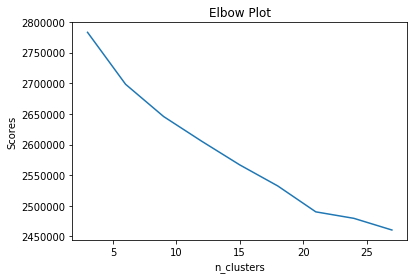

In [168]:
plot_scores_vs_clusters(clusters, inertias)

In [173]:
labels = retrain_kmeans(21, train_vect)
# cluster_centers.columns = count_vect.get_feature_names()

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [174]:
# Please write all the code with proper documentation

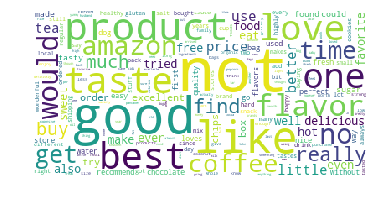

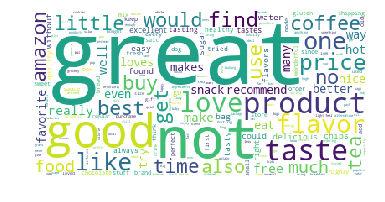

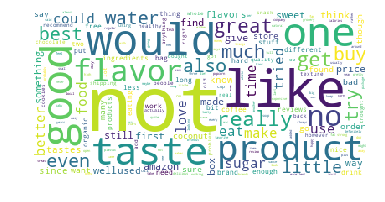

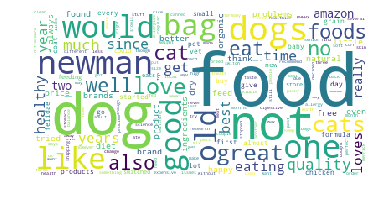

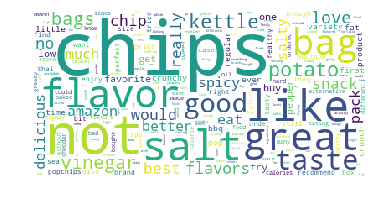

...

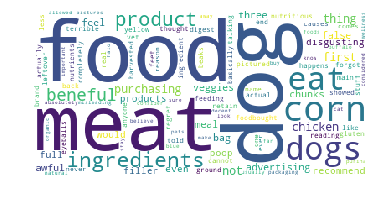

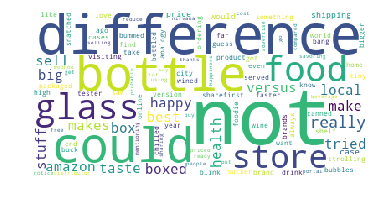

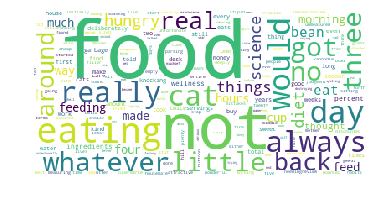

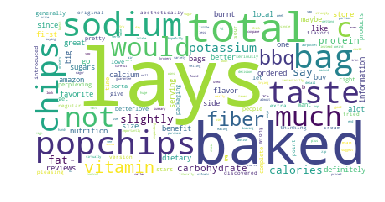

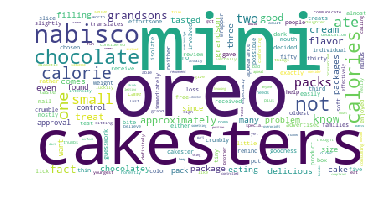

In [175]:
X = frompicklefile('train_data')
build_wordclouds(X, labels)

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [176]:
# Please write all the code with proper documentation

In [177]:
count_vect = apply_vectorizers_train_test('K-Means','TF-IDF')

'train_vect' and 'test_vect' are the pickle files.


In [178]:
train_vect = frompicklefile('train_vect')
print(train_vect.shape)

(50000, 94974)


In [179]:
clusters = [i for i in range(3,30,3)]
inertias = apply_kmeans(train_vect, clusters)

inertias:  [49316.776665936064, 48977.8197000542, 48778.11200163094, 48691.98896329182, 48583.84705417568, 48489.16853003041, 48396.757929995205, 48334.89818027341, 48234.77968919288]


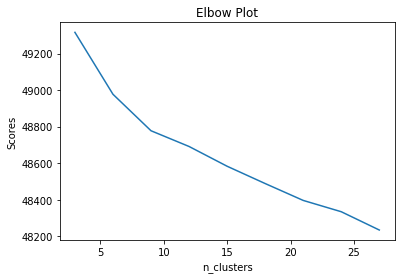

In [180]:
plot_scores_vs_clusters(clusters, inertias)

In [181]:
labels = retrain_kmeans(24, train_vect)
# cluster_centers.columns = count_vect.get_feature_names()

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

In [182]:
# Please write all the code with proper documentation

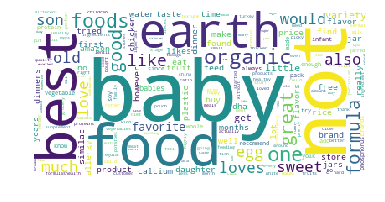

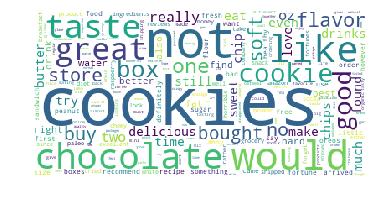

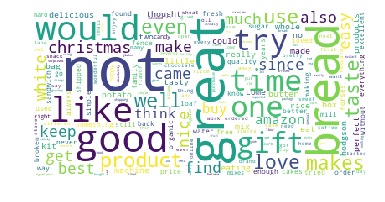

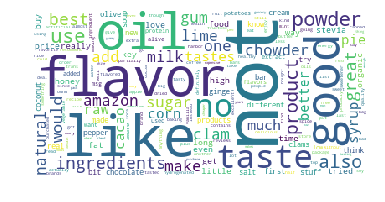

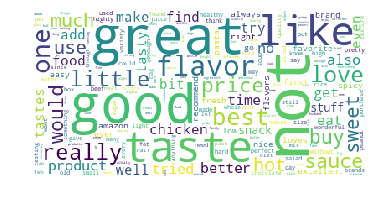

...

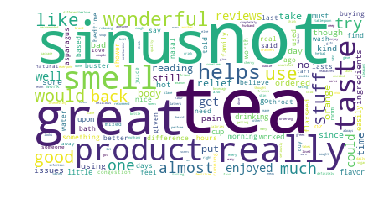

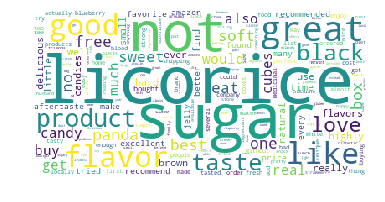

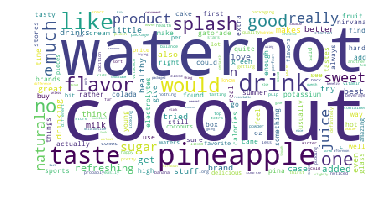

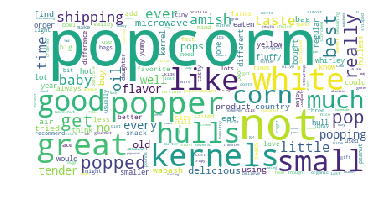

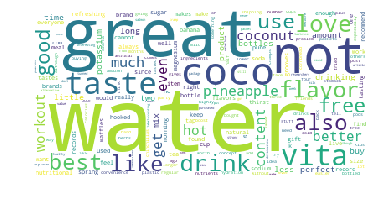

In [183]:
X = frompicklefile('train_data')
build_wordclouds(X, labels)

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [184]:
# Please write all the code with proper documentation

In [185]:
count_vect = apply_vectorizers_train_test('K-Means','AvgW2V')

100%|██████████| 50000/50000 [02:18<00:00, 361.52it/s]


'train_vect' and 'test_vect' are the pickle files.


In [186]:
train_vect = frompicklefile('train_vect')
print(np.array(train_vect).shape)

(50000, 50)


In [187]:
clusters = [i for i in range(3,30,3)]
inertias = apply_kmeans(np.array(train_vect), clusters)

inertias:  [594318.871304865, 515956.0398180838, 479639.9847238011, 456745.9402171078, 441160.06869269465, 429476.95456389827, 420433.3490846813, 413024.5671544436, 405320.34390025906]


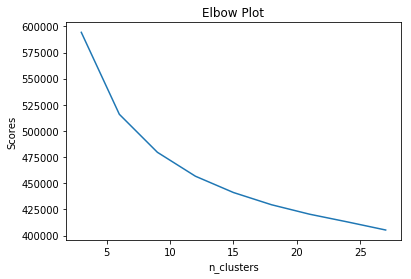

In [188]:
plot_scores_vs_clusters(clusters, inertias)

In [189]:
labels = retrain_kmeans(24, np.array(train_vect))
# cluster_centers.columns = count_vect.get_feature_names()

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

In [190]:
# Please write all the code with proper documentation

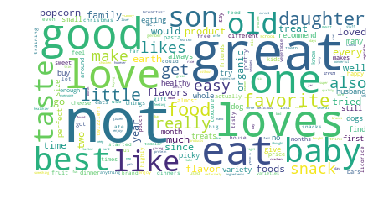

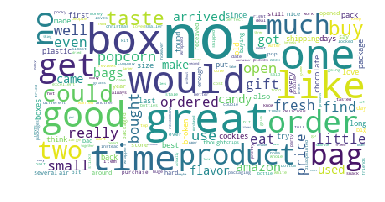

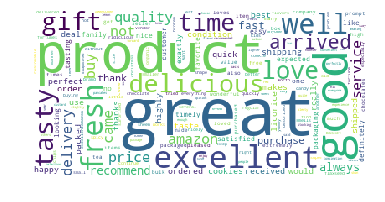

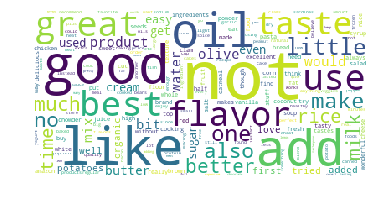

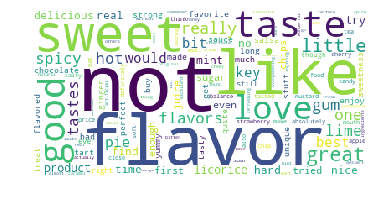

...

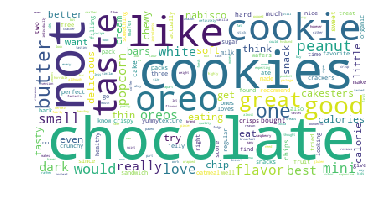

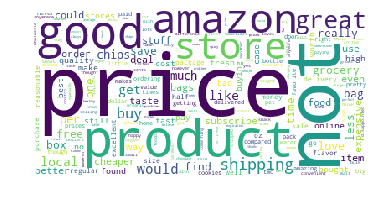

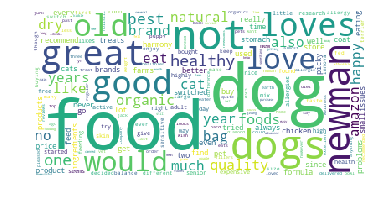

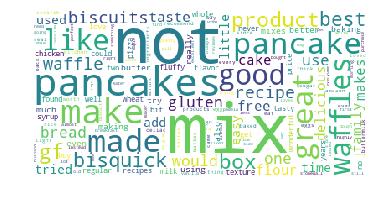

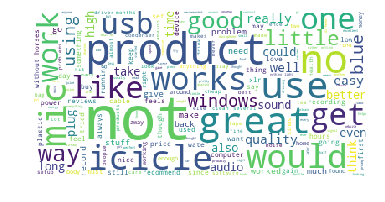

In [191]:
build_wordclouds(X, labels)

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [192]:
# Please write all the code with proper documentation

In [193]:
count_vect = apply_vectorizers_train_test('K-Means','TF-IDF W2V')

100%|██████████| 50000/50000 [10:28<00:00, 79.56it/s]


'train_vect' and 'test_vect' are the pickle files.


In [194]:
train_vect = frompicklefile('train_vect')
print(np.array(train_vect).shape)

(50000, 50)


In [195]:
clusters = [i for i in range(3,30,3)]
inertias = apply_kmeans(np.array(train_vect), clusters)

inertias:  [802692.1832587925, 685241.5240394964, 621654.1069478836, 588293.6762042007, 566068.8737244568, 545592.4509841719, 529019.4843479622, 515399.9400811909, 502204.1399277447]


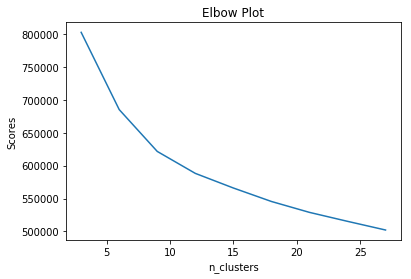

In [196]:
plot_scores_vs_clusters(clusters, inertias)

In [197]:
labels = retrain_kmeans(24, np.array(train_vect))
# cluster_centers.columns = count_vect.get_feature_names()

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

In [198]:
# Please write all the code with proper documentation

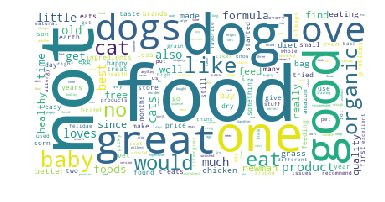

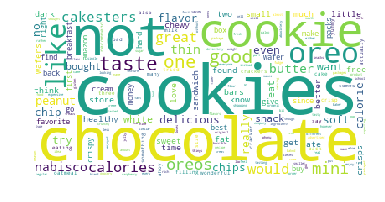

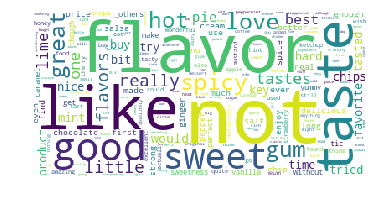

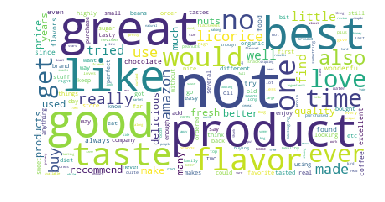

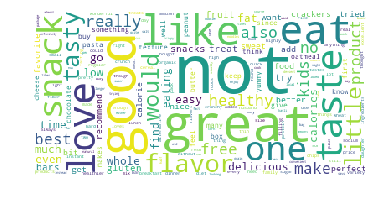

...

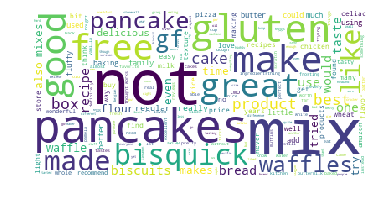

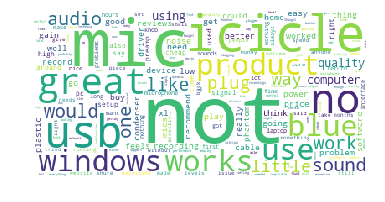

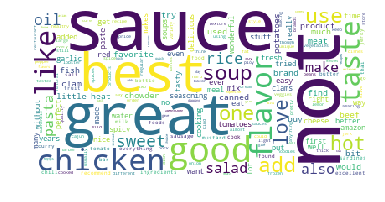

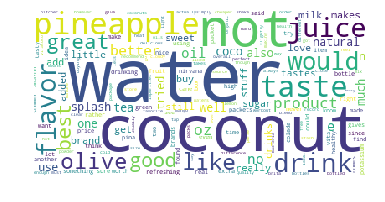

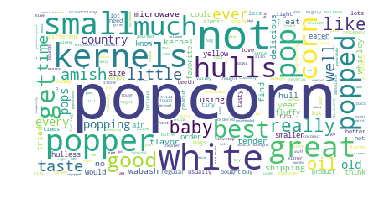

In [199]:
build_wordclouds(X, labels)

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [200]:
# Please write all the code with proper documentation

In [241]:
count_vect = apply_vectorizers_train_test('Agglomerative','AvgW2V')

100%|██████████| 5000/5000 [00:09<00:00, 563.62it/s]

'train_vect' and 'test_vect' are the pickle files.


In [242]:
train_vect = frompicklefile('train_vect')
print(np.array(train_vect).shape)

(5000, 50)


In [243]:
labels = apply_agglomerative(9, np.array(train_vect))

### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

In [244]:
# Please write all the code with proper documentation

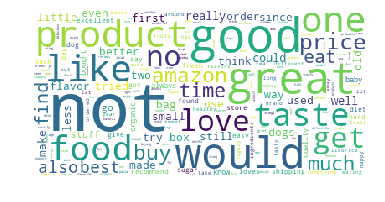

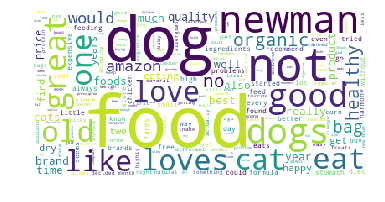

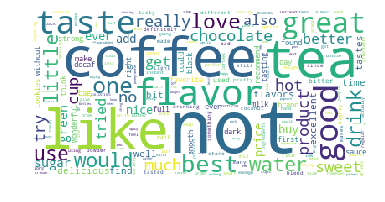

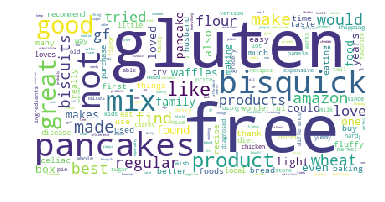

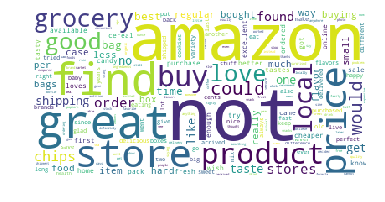

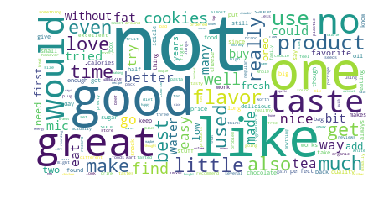

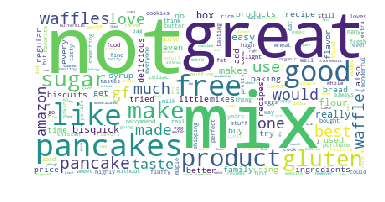

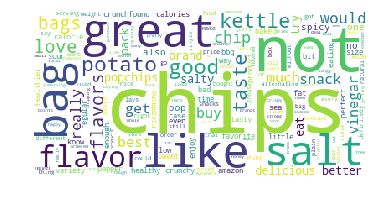

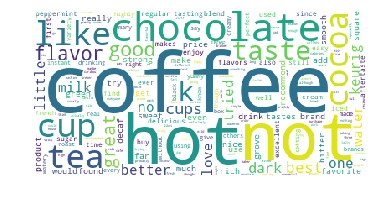

In [245]:
X = frompicklefile('train_data')
build_wordclouds(X, labels)

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [246]:
# Please write all the code with proper documentation

In [247]:
count_vect = apply_vectorizers_train_test('Agglomerative','TF-IDF W2V')

100%|██████████| 5000/5000 [00:42<00:00, 111.90it/s]

'train_vect' and 'test_vect' are the pickle files.


In [248]:
train_vect = frompicklefile('train_vect')
print(np.array(train_vect).shape)

(5000, 50)


In [249]:
labels = apply_agglomerative(9, np.array(train_vect))

### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

In [250]:
# Please write all the code with proper documentation

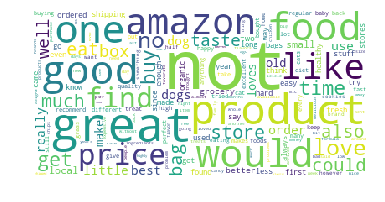

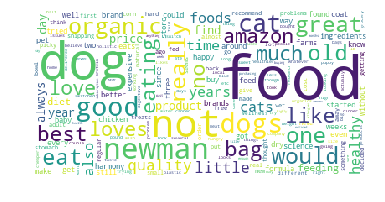

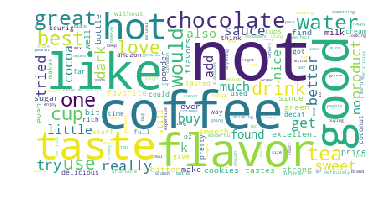

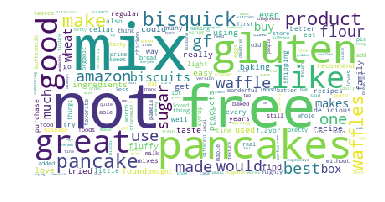

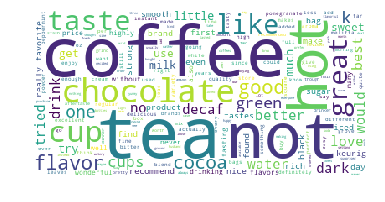

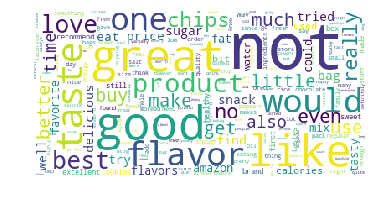

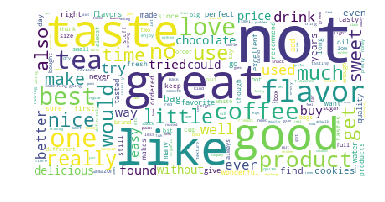

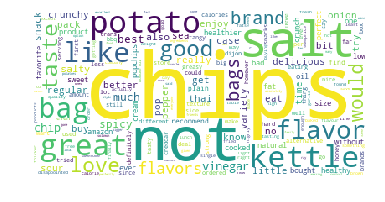

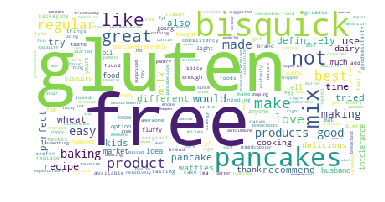

In [251]:
X = frompicklefile('train_data')
build_wordclouds(X, labels)

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [212]:
# Please write all the code with proper documentation

In [45]:
count_vect = apply_vectorizers_train_test('DBSCAN','AvgW2V')

100%|██████████| 5000/5000 [00:08<00:00, 580.04it/s]

'train_vect' and 'test_vect' are the pickle files.


In [46]:
train_vect = frompicklefile('train_vect')
print(np.array(train_vect).shape)

(5000, 50)


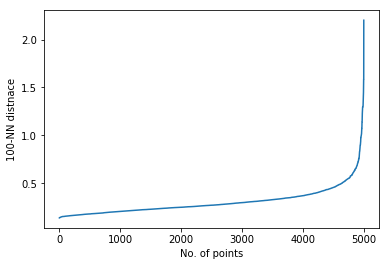

In [53]:
k_dist_plot(100,train_vect,np.array(train_vect).shape[0])

In [55]:
labels = apply_dbscan(0.8,2*(np.array(train_vect).shape[1]),np.array(train_vect))

noisy_pts = np.count_nonzero(labels == -1)
print('% noisy points: ', str((noisy_pts/len(labels))*100)+'%')

% noisy points:  0.24%


### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

In [56]:
# Please write all the code with proper documentation

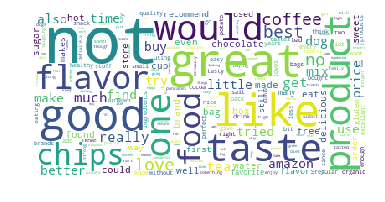

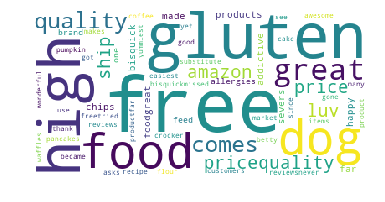

In [57]:
X = frompicklefile('train_data')
build_wordclouds(X, labels)

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [58]:
# Please write all the code with proper documentation

In [60]:
count_vect = apply_vectorizers_train_test('DBSCAN','TF-IDF W2V')

100%|██████████| 5000/5000 [00:41<00:00, 121.48it/s]

'train_vect' and 'test_vect' are the pickle files.


In [61]:
train_vect = frompicklefile('train_vect')
print(np.array(train_vect).shape)

(5000, 50)


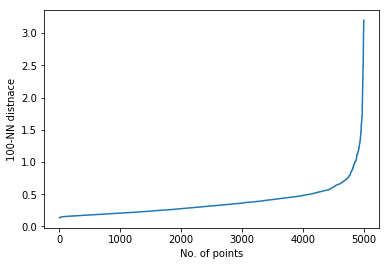

In [62]:
k_dist_plot(100,train_vect,np.array(train_vect).shape[0])

In [70]:
labels3 = apply_dbscan(0.8,2*(np.array(train_vect).shape[1]),np.array(train_vect))

noisy_pts = np.count_nonzero(labels3 == -1)
print('% noisy points: ', str((noisy_pts/len(labels3))*100)+'%')

% noisy points:  1.2%


### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

In [71]:
# Please write all the code with proper documentation

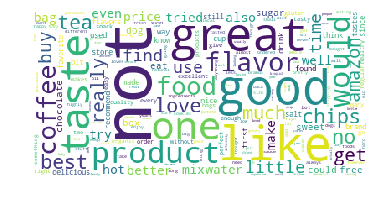

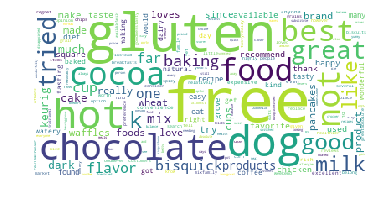

In [72]:
X = frompicklefile('train_data')
build_wordclouds(X, labels3)

# [6] Conclusions

In [69]:
# Please compare all your models using Prettytable library. 
# You can have 3 tables, one each for kmeans, agllomerative and dbscan

## [6.1] Observations:

K-Means:

1. Data points: 50,000 points were considered for K-Means.


2. Hyperparameter in K-Means: 

        a) Number of Clusters: The numbers ranging from 3 to 30 with interval of 3 were considered to get find the optimal number of clusters using Elbow method.
        b) Optimal cluster number obtained in K-Means is around 20-25 for different models.


3. Wordclouds:

        a) WC1: This cluster contains words related to dog/cat food. Ex: dog, cat, food, love, feeding etc.
        
        b) WC2: This cluster contains words related to oreo/cookies or chocolates, chips. Ex: cookies, cookie, oreo, oreos, cakesters, chips, chip, calories, delicious etc.
        
        c) WC3: This cluster contains similar words related to the reviews of the products related to taste, flavour, quality and etc.
        
        d) WC4: This cluster is similar to the WC3
        
        f) WC5: This cluster is related to the buying products/gifting them for holiday season in US. Ex: gift, christmas, great, loved, product, ordered, time, perfect, arrived, party, daughter, order, came and etc.
        
        g) WC6: This cluster is also similar to amazon products and shipmet related words.
        
        h) WC7: This cluster is related to the ingredients in the food products. Ex: Sigar, corn, taste, ingredients, flavor, fat, low, artificial, protien, calories and etc.
        
        i) WC8: This cluster is similar to the WC3
        
        j) WC9: This cluster contains similar words related to Chips. Ex: chips, salty, potato, bags, chip, snack, flavor, spicy, calories, lays, crunchy and etc.
        
        h) WC10: This cluster contains similar words related to beverages to tea/coffee. Ex: tea, coffee, taste, really love, flavor, hot, chocolate etc.
        
        i) WC11: This cluster is similar to the WC10
        
        j) WC12: This cluster contains similar words related to pancakes, waffles, biscuits and etc. Ex: pancakes, waffles, biscuits, gluten, free, bisquick(product), sigar, make, ingredients, baking etc.
        
        k) WC13: This cluster is similar to the WC10
        
        l) WC14: This cluster contains similar words related to Chips. Ex: chips, salty, potato, bags, chip, snack, flavor, spicy, calories, lays, crunchy and etc.
        
        m) WC15: This cluster is similar to the WC1
        
        n) WC16: This cluster is similar to the WC12
        
        0) WC17: This cluster contains similar words related to sauce/soup. Ex: tea, sauce, soup, salad, chicken, seasoning, cooking, fish, garlic etc.

Agglomerative Clustering:


1. Data points: 5,00 points were considered for Agglomerative Clustering.


2. No. of Clusters: 9 clusters is considered for n_clusters as the data points are low in number compared to K-Means.


3. Wordclouds:

        a) WC1: This cluster contains similar tastes of food products on Amazon. Ex: amazon, food, buy, product, good, taste, price, order, think etc.
        
        b) WC2: This cluster contains words related to dog/cat food. Ex: dog, cat, food, love, feeding etc.
        
        c) WC3: This cluster contains similar words related to beverages to tea/coffee. Ex: tea, coffee, taste, really love, flavor, hot, chocolate etc.
        
        d) WC4: This cluster contains similar words related to pancakes, waffles, biscuits and etc. Ex: pancakes, waffles, biscuits, gluten, free, bisquick(product), sigar, make, ingredients, baking etc.
        
        e) WC5: This cluster is very similar like WC3.
        
        f) WC6: This cluster contains similar words related to the reviews of the products related to taste, flavour, quality and etc.
        
        g) WC7: This cluster is very similar to WC4.
        
        h) WC8: This cluster contains similar words related to Chips. Ex: chips, salty, potato, bags, chip, snack, flavor, spicy, calories, lays, crunchy and etc.
        
        i) his cluster is very similar like WC3.

DBSCAN:

1) Hyperparameter in DBSCAN:

        a) Number of Clusters: 2* dimensionality of the vector is chosen as a rule of thumb
        b) eps: Values like 0.1, 0.5, 1.0 were considered for the dataset. % noisy points decreased dramatically as the eps value increased.


2) Wordclouds:

        Cluster1: This cluster groups the similar words related products like Coffee, tea, sugar etc., and opinions on them like good, great, delicious and tec
        
        Cluster2: This cluster groups the words related to food ingredients(cocoa, milk, chocolate and etc.), process involved(baking, mixing etc.), products(bisquick), and some properties of food ingredients like gluten free and etc. 